# Proyecto 2: Filtros sobre Imágenes
## Por José Roberto Rodríguez Meza

Este proyecto se centra en el procesamiento y clasificación de imágenes mediante técnicas de análisis visual. Se aplicaron filtros de escala de grises y detección de bordes para extraer características visuales relevantes, y se clasificaron las imágenes en función de su brillo, diferenciando entre imágenes "oscuras" y "brillantes". El resultado final consistió en la creación de un collage visual que muestra las imágenes organizadas según su luminosidad, brindando una forma efectiva de visualizar las variaciones en las características de las imágenes. Este enfoque ofrece una base para la manipulación y análisis visual, con aplicaciones potenciales en áreas como la visión por computadora y el análisis de imágenes.

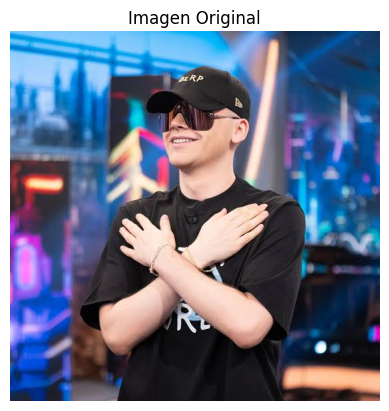

In [33]:
# Visualicemos la Imagen Original
from PIL import Image, ImageFilter, ImageEnhance
import matplotlib.pyplot as plt
imagen_original = Image.open("BZRP.jpeg")
plt.imshow(imagen_original)
plt.title("Imagen Original")
plt.axis('off')
plt.show()


# Filtro de desenfoque (blur)
Decidimos aplicar el filtro Blur porque permite simplificar la imagen, eliminando ruido o detalles menores que podrían interferir con la detección de formas generales.

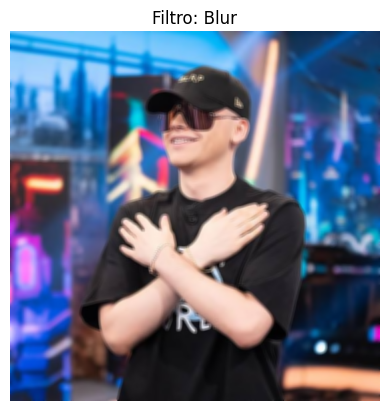

In [34]:
imagen_blur = imagen_original.filter(ImageFilter.BLUR)
plt.imshow(imagen_blur)
plt.title("Filtro: Blur")
plt.axis('off')
plt.show()


# Filtro BoxBlur
Elegimos un BoxBlur con radio 5 porque nos da un efecto de desenfoque más controlado a diferencia con radio 25 y radio 50. Este filtro es útil para eliminar ruido de fondo mientras se conserva la forma general de los objetos en la imagen, lo que puede ser importante para clasificarlas según su silueta o estructura general.



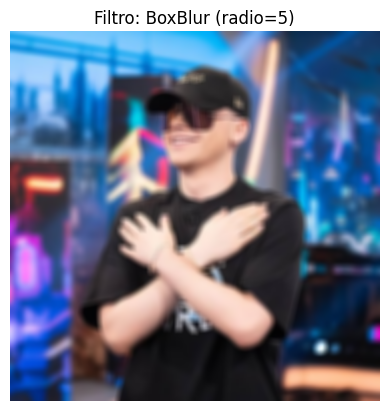

In [35]:
imagen_box_blur = imagen_original.filter(ImageFilter.BoxBlur(5))
plt.imshow(imagen_box_blur)
plt.title("Filtro: BoxBlur (radio=5)")
plt.axis('off')
plt.show()


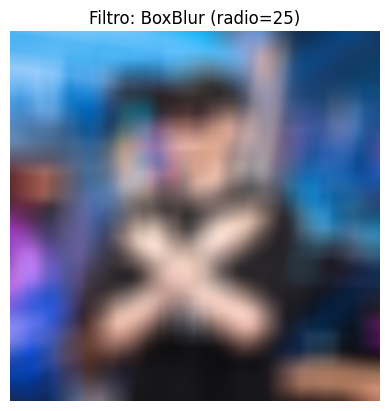

In [36]:
# Ahora con un radio de 25
imagen_box_blur = imagen_original.filter(ImageFilter.BoxBlur(25))
plt.imshow(imagen_box_blur)
plt.title("Filtro: BoxBlur (radio=25)")
plt.axis('off')
plt.show()


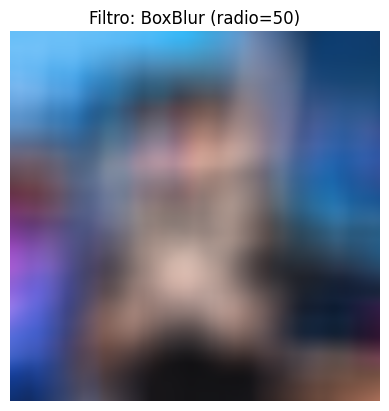

In [37]:
# Ahora con un radio de 50
imagen_box_blur = imagen_original.filter(ImageFilter.BoxBlur(50))
plt.imshow(imagen_box_blur)
plt.title("Filtro: BoxBlur (radio=50)")
plt.axis('off')
plt.show()

# GaussianBlur
Usamos GaussianBlur porque es un filtro muy común en visión por computadora para suavizar imágenes preservando bordes importantes. Suprime el ruido de forma más natural que otros filtros y es ideal cuando queremos preparar la imagen para detección de contornos o segmentación posterior. Para nuestra imagen a modelar, empleamos radios de 3 y 5, respectivamente.

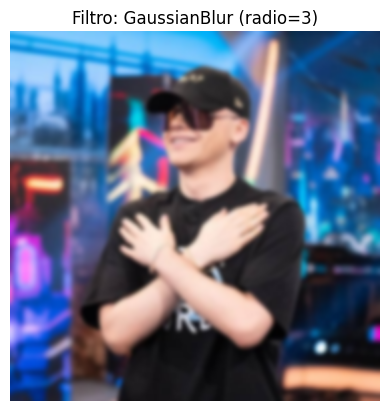

In [38]:
# Aplicamos un desenfoque gaussiano con un radio de 3
imagen_gaussian = imagen_original.filter(ImageFilter.GaussianBlur(radius=3))
plt.imshow(imagen_gaussian)
plt.title("Filtro: GaussianBlur (radio=3)")
plt.axis('off')
plt.show()


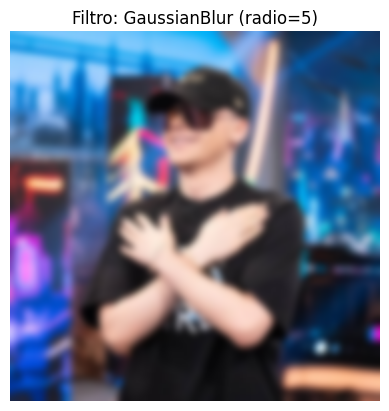

In [39]:
# Ahora con un radio de 5
imagen_gaussian = imagen_original.filter(ImageFilter.GaussianBlur(radius=5))
plt.imshow(imagen_gaussian)
plt.title("Filtro: GaussianBlur (radio=5)")
plt.axis('off')
plt.show()


# Contour
Aplicamos el filtro Contour porque nos permite observar las líneas principales de la imagen. Esto es útil en clasificación cuando queremos centrarnos en la forma de los objetos, como siluetas o bordes, sin que el color o la textura interfieran.

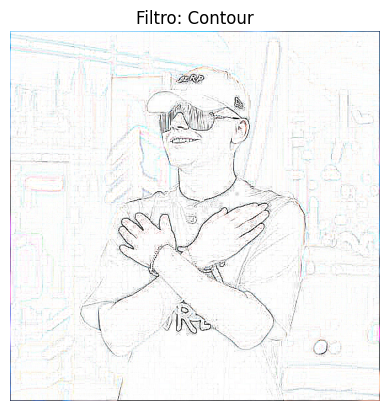

In [41]:
imagen_contour = imagen_original.filter(ImageFilter.CONTOUR)
plt.imshow(imagen_contour)
plt.title("Filtro: Contour")
plt.axis('off')
plt.show()


# Edge Enhance
Utilizamos EDGE_ENHANCE para aumentar la visibilidad de los bordes y contrastes suaves. Esto puede ayudar a los modelos de clasificación a captar detalles estructurales importantes, especialmente en imágenes donde las diferencias de color o textura no son tan evidentes.

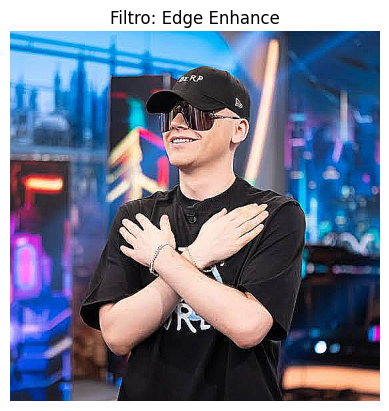

In [40]:
imagen_edge_enhance = imagen_original.filter(ImageFilter.EDGE_ENHANCE)
plt.imshow(imagen_edge_enhance)
plt.title("Filtro: Edge Enhance")
plt.axis('off')
plt.show()


# Emboss
Usamos EMBOSS porque transforma la imagen en un mapa de relieve que resalta variaciones de profundidad. Es especialmente útil cuando queremos destacar estructuras o patrones que no son tan visibles en la imagen original, facilitando así su clasificación por textura o forma.

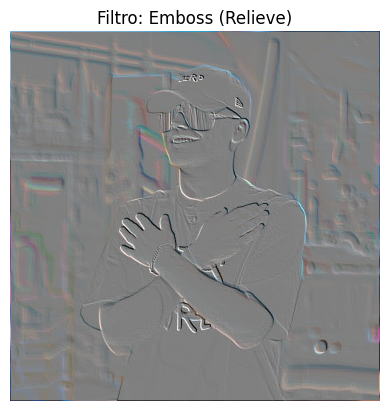

In [42]:
imagen_emboss = imagen_original.filter(ImageFilter.EMBOSS)
plt.imshow(imagen_emboss, cmap='gray')
plt.title("Filtro: Emboss (Relieve)")
plt.axis('off')
plt.show()


# Escala de grises
Utilizamos la conversión a escala de grises para eliminar la información de color y centrarnos en la estructura visual de la imagen. Esto ayuda a reducir el tamaño de los datos y facilita tareas como detección de bordes, reconocimiento de formas o clasificación basada en patrones de intensidad.

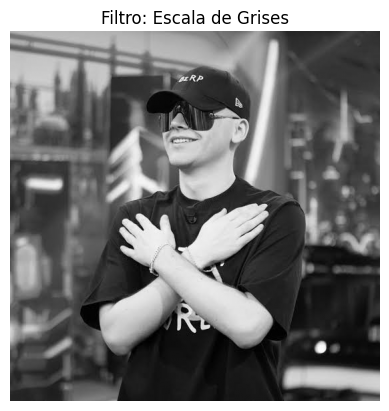

In [43]:
imagen_gris = imagen_original.convert('L')
plt.imshow(imagen_gris, cmap='gray')
plt.title("Filtro: Escala de Grises")
plt.axis('off')
plt.show()


# Brillo Aumentado
Aplicamos este filtro para simular cómo reacciona nuestro sistema de procesamiento ante cambios en las condiciones de iluminación. Aumentar el brillo puede ayudar a resaltar detalles ocultos en zonas oscuras, lo cual podría mejorar la precisión en la detección de características relevantes para la clasificación. Emplearemos el Brillo Aumentado al doble y al cuadruple.

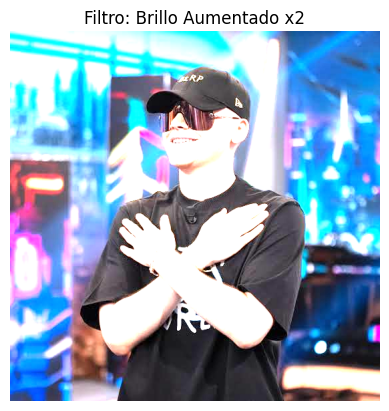

In [45]:
from PIL import ImageEnhance
mejorador_brillo = ImageEnhance.Brightness(imagen_original)

# Aumentamos el brillo al doble (factor = 2.0)
imagen_mas_brillante = mejorador_brillo.enhance(2.0)
plt.imshow(imagen_mas_brillante)
plt.title("Filtro: Brillo Aumentado x2")
plt.axis('off')
plt.show()


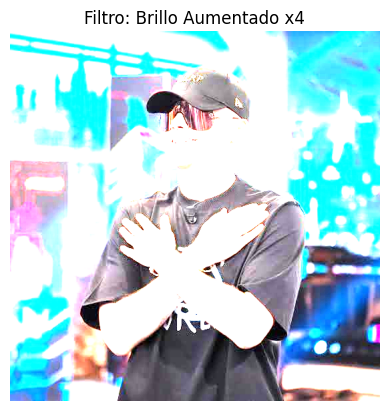

In [46]:
# Aumentamos el brillo al cuadruple (factor =4.0)
imagen_mas_brillante = mejorador_brillo.enhance(4.0)
plt.imshow(imagen_mas_brillante)
plt.title("Filtro: Brillo Aumentado x4")
plt.axis('off')
plt.show()


# Filtro Kernel Personalizado
Elegimos este filtro porque al reforzar el píxel central, conseguimos enfocar la imagen, realzando bordes y detalles. Esta técnica es común en tareas de visión por computadora donde la nitidez es clave para una buena detección o segmentación de objetos.

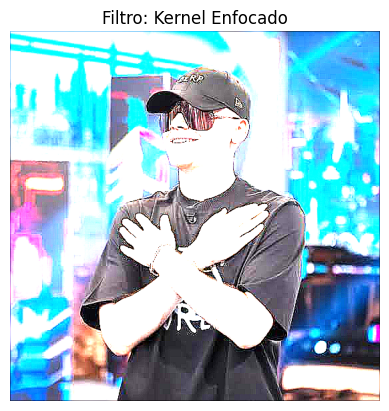

In [47]:
kernel_personalizado = imagen_original.filter(
    ImageFilter.Kernel(
        size=(3, 3),  # Tamaño del núcleo: 3x3
        kernel=(-1, -1, -1,
                -1, 11, -1,
                -1, -1, -1),  # Matriz para enfocar
        scale=1,       # Factor de normalización (suma de pesos)
        offset=0       # No desplazamos el resultado
    )
)
plt.imshow(kernel_personalizado)
plt.title("Filtro: Kernel Enfocado")
plt.axis('off')
plt.show()


# Clasificación de Imágenes
Aplicamos filtros de escala de grises y detección de bordes a un conjunto de imágenes para clasificarlas según su brillo. Usamos la conversión a escala de grises para simplificar el análisis y el filtro de bordes para resaltar detalles. La clasificación por brillo permite distinguir entre imágenes oscuras y brillantes, facilitando su análisis visual.

BZRP.jpeg


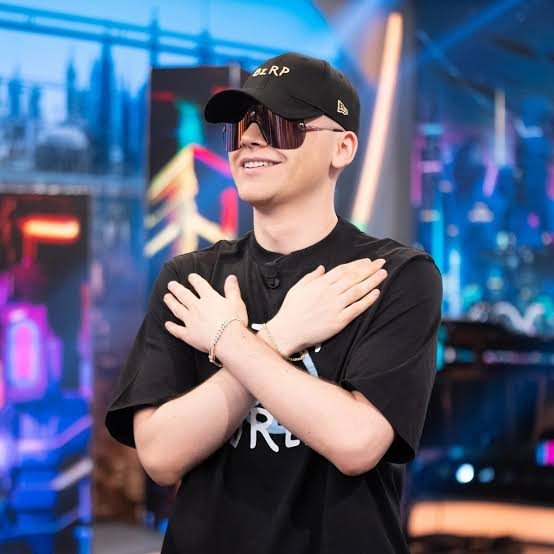

BZRP1.png


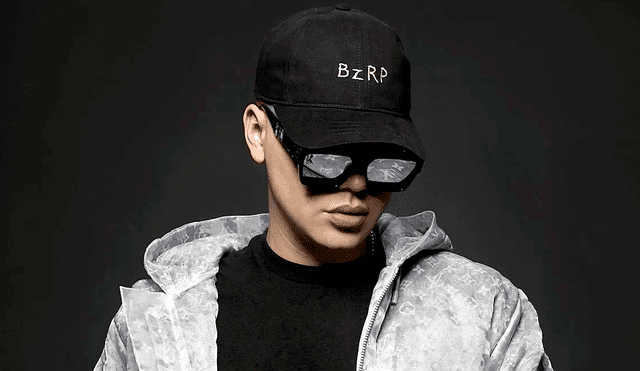

BZRP2.jpg


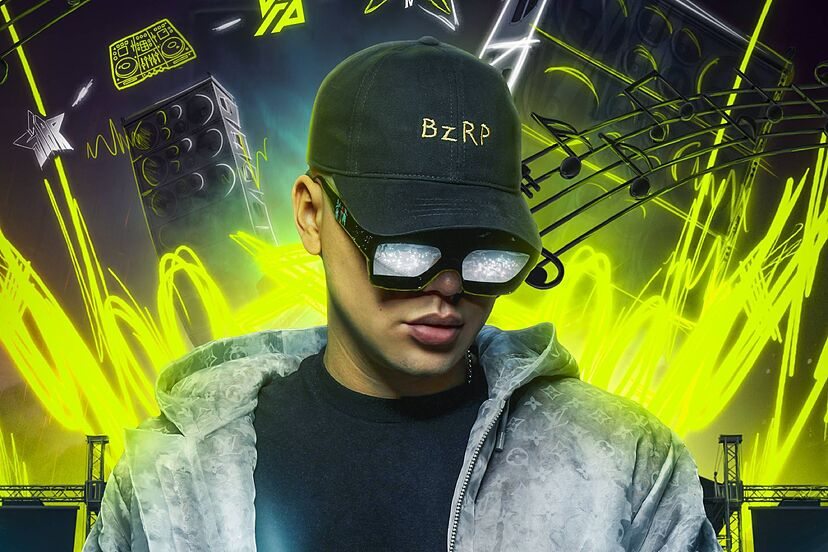

BZRP3.jpg


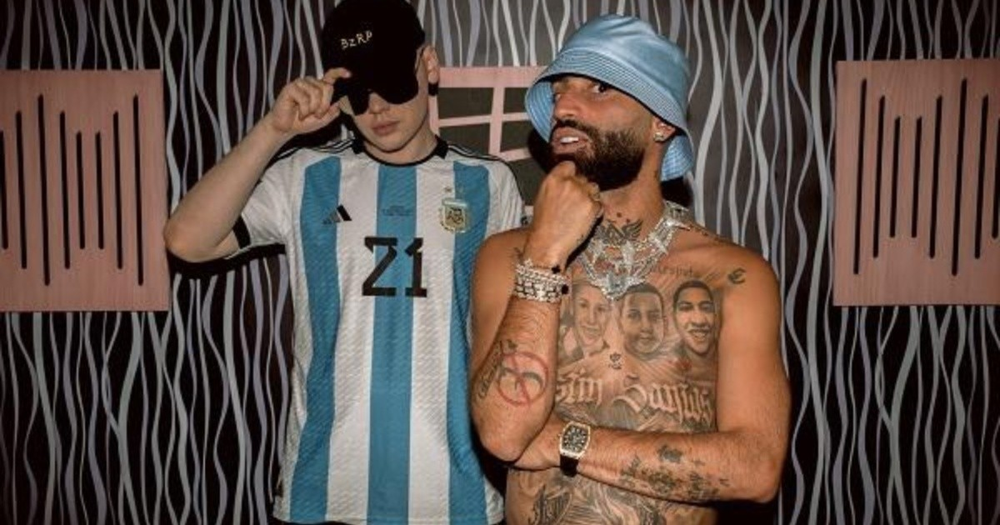

BZRP4.jpg


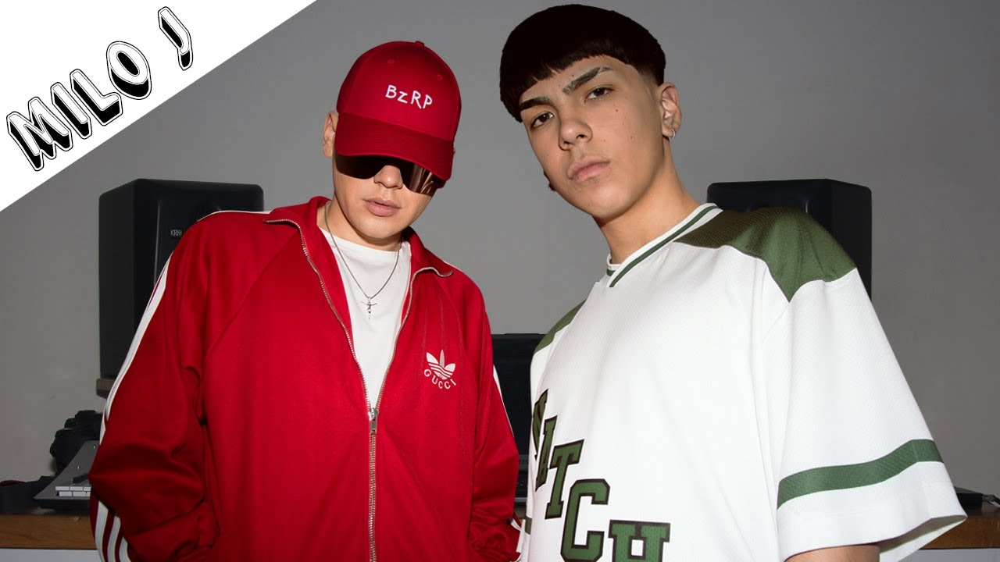

BZRP5.jpeg


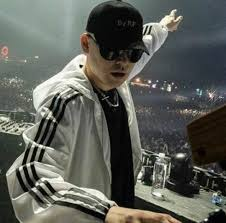

BZRP6.jpg


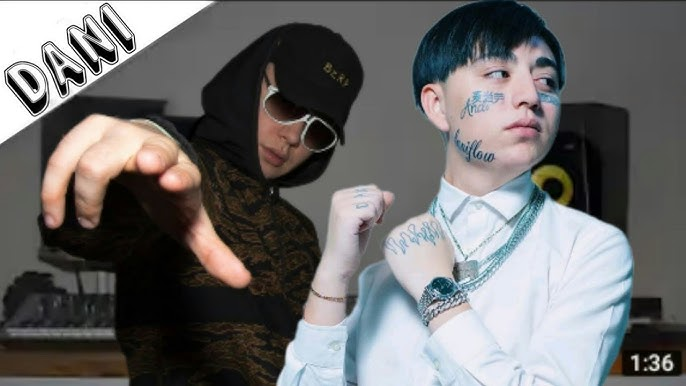

BZRP7.jpg


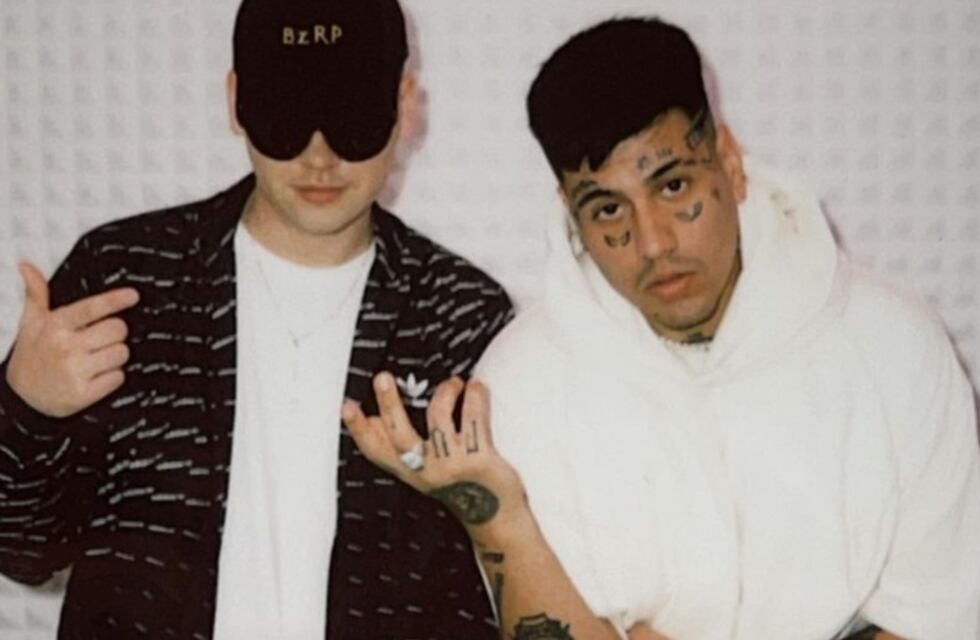

BZRP8.jpg


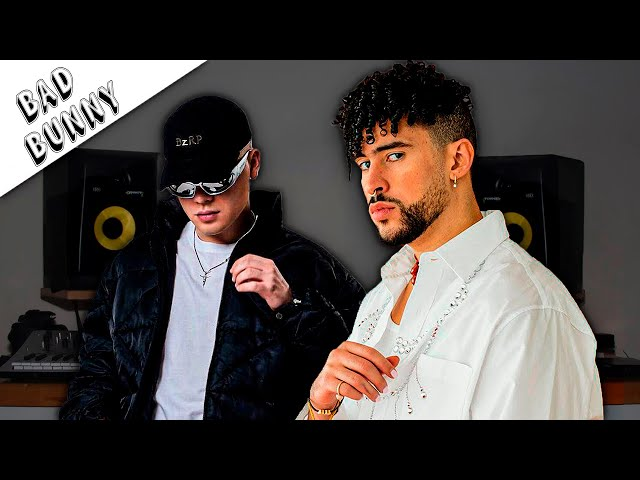

In [71]:
# Visualicemos las Imágenes Originales
from IPython.display import Image, display
import os
imagenes = ['BZRP.jpeg', 'BZRP1.png', 'BZRP2.jpg','BZRP3.jpg','BZRP4.jpg','BZRP5.jpeg','BZRP6.jpg','BZRP7.jpg','BZRP8.jpg']
for img in imagenes:
    if os.path.exists(img):
        print(f"{img}")
        display(Image(filename=img))
    else:
        print(f"No se encontró el archivo: {img}")

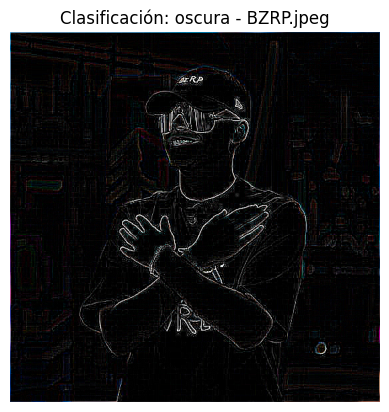

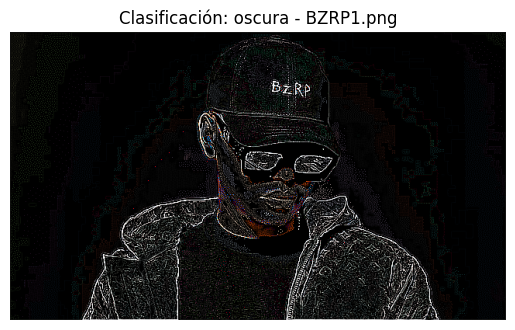

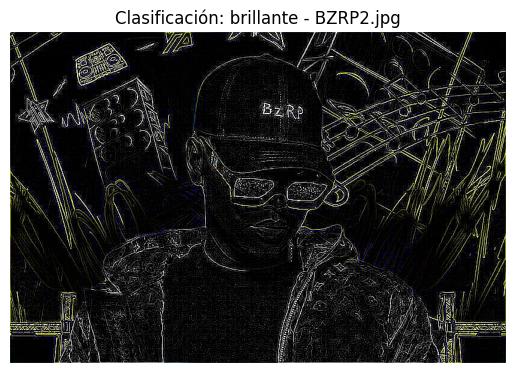

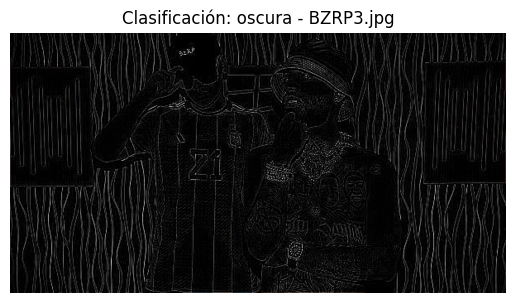

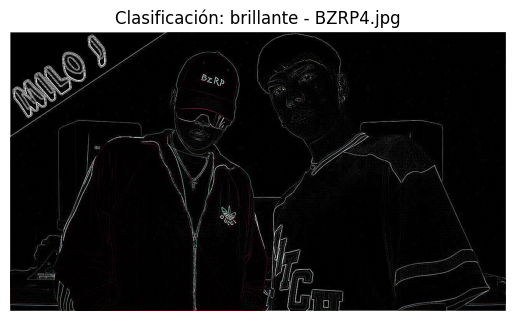

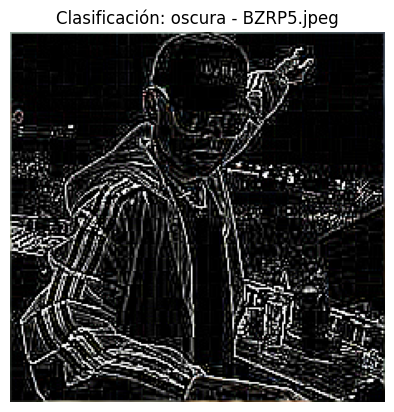

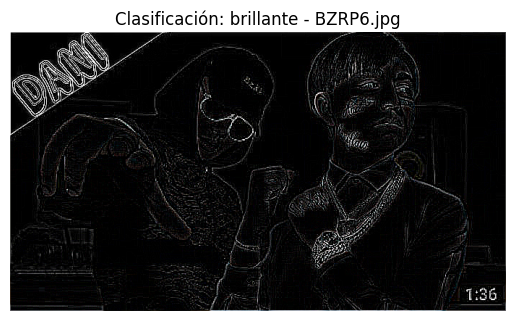

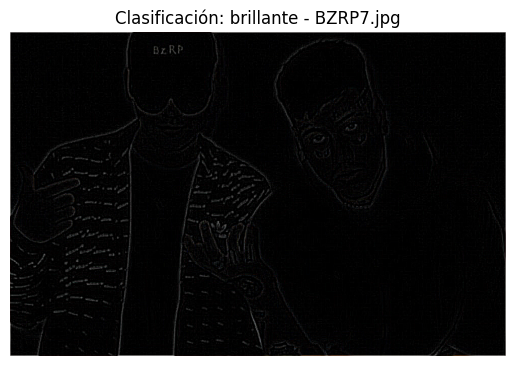

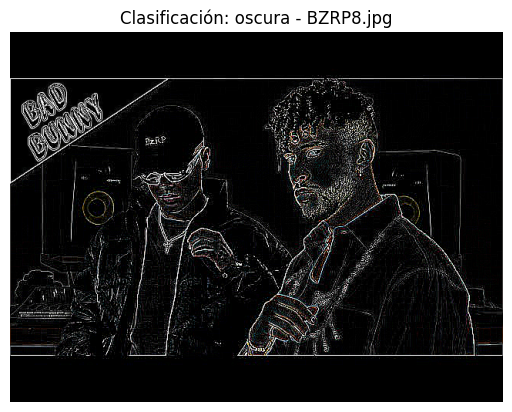

{'BZRP.jpeg': 'oscura', 'BZRP1.png': 'oscura', 'BZRP2.jpg': 'brillante', 'BZRP3.jpg': 'oscura', 'BZRP4.jpg': 'brillante', 'BZRP5.jpeg': 'oscura', 'BZRP6.jpg': 'brillante', 'BZRP7.jpg': 'brillante', 'BZRP8.jpg': 'oscura'}


In [58]:
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt
import numpy as np
imagenes = ['BZRP.jpeg', 'BZRP1.png', 'BZRP2.jpg','BZRP3.jpg','BZRP4.jpg','BZRP5.jpeg','BZRP6.jpg','BZRP7.jpg','BZRP8.jpg']

# Función para aplicar filtros y clasificar imágenes
def aplicar_filtros_y_clasificar(imagen_path):
    imagen = Image.open(imagen_path)
    if imagen.mode == 'P':
        imagen = imagen.convert('RGB')
    imagen_gris = imagen.convert('L')

    # Convertimos la imagen a un array
    imagen_array = np.array(imagen_gris)

    # Convertimos la imagen a modo compatible con filtros
    imagen_para_filtro = imagen.convert('RGB')
    imagen_bordes = imagen_para_filtro.filter(ImageFilter.FIND_EDGES)

    # Clasificación por brillo
    brillo = np.mean(imagen_array)
    clasificacion = 'oscura' if brillo < 100 else 'brillante'

    return clasificacion, imagen_bordes

# Procesamos las imágenes
resultados = {}
for archivo in imagenes:
    clasificacion, imagen_bordes = aplicar_filtros_y_clasificar(archivo)
    resultados[archivo] = {'clasificacion': clasificacion, 'imagen_bordes': imagen_bordes}
    plt.imshow(imagen_bordes)
    plt.title(f"Clasificación: {clasificacion} - {archivo}")
    plt.axis('off')
    plt.show()
print({archivo: resultados[archivo]['clasificacion'] for archivo in resultados})


# Collage de Luminosidad
Ahora las imágenes se ordenan de menor a mayor brillo y se muestran en un collage, lo que permite una comparación visual clara y ordenada de los resultados obtenidos, destacando las diferencias de luminosidad y características visuales.

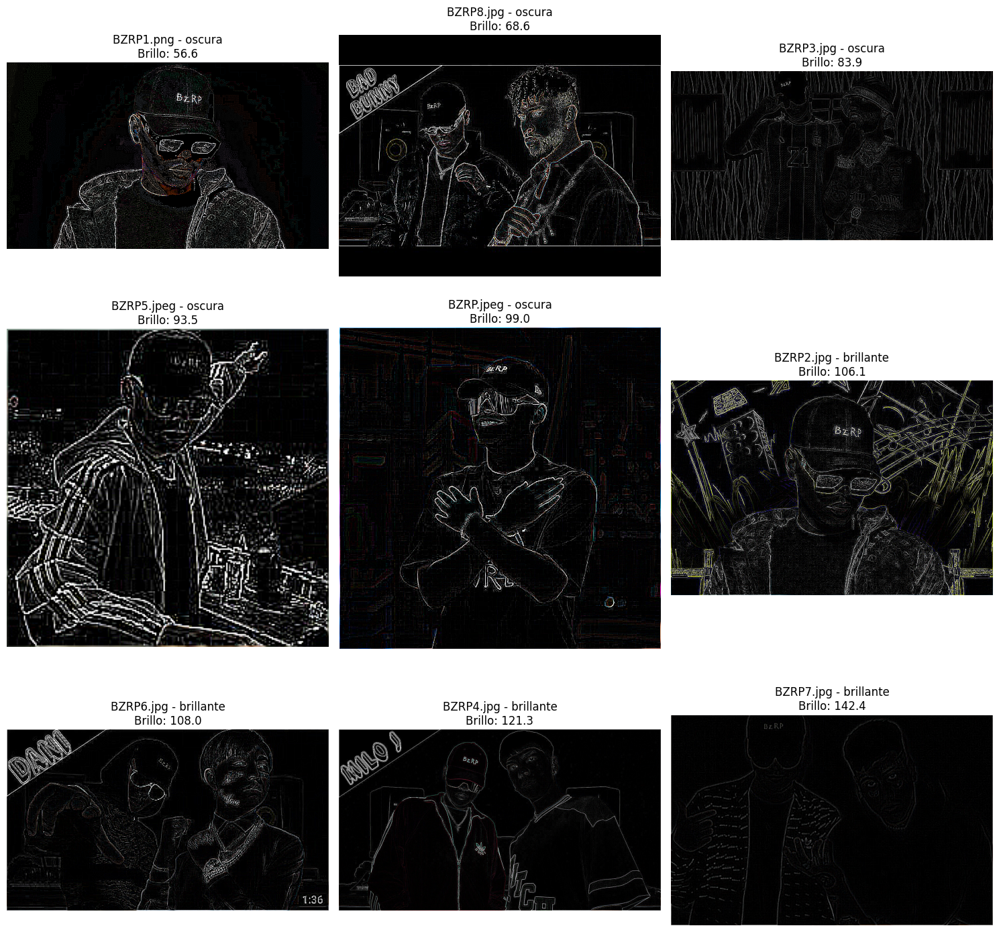

In [62]:
from PIL import Image, ImageFilter
import math
imagenes = ['BZRP.jpeg', 'BZRP1.png', 'BZRP2.jpg', 'BZRP3.jpg', 'BZRP4.jpg', 'BZRP5.jpeg', 'BZRP6.jpg','BZRP7.jpg','BZRP8.jpg']

# Clasificación y procesamiento
imagenes_procesadas = []

for archivo in imagenes:
    imagen = Image.open(archivo).convert("RGB")
    imagen_gris = imagen.convert('L')
    imagen_array = np.array(imagen_gris)

    brillo = np.mean(imagen_array)
    clasificacion = 'oscura' if brillo < 100 else 'brillante'
    imagen_bordes = imagen.filter(ImageFilter.FIND_EDGES)
    imagenes_procesadas.append((archivo, imagen_bordes, clasificacion, brillo))

# Ordenamos por brillo ascendente (de más oscura a más brillante)
imagenes_procesadas.sort(key=lambda x: x[3])
columnas = 3
filas = math.ceil(len(imagenes_procesadas) / columnas)
fig, axs = plt.subplots(filas, columnas, figsize=(15, 5 * filas))
axs = axs.flatten()
for i, (nombre, imagen_proc, clasif, brillo) in enumerate(imagenes_procesadas):
    axs[i].imshow(imagen_proc)
    axs[i].set_title(f"{nombre} - {clasif}\nBrillo: {brillo:.1f}")
    axs[i].axis('off')
for j in range(i+1, len(axs)):
    axs[j].axis('off')
plt.tight_layout()
plt.show()


# Conclusión
Aplicamos un conjunto de técnicas de procesamiento de imágenes, utilizando filtros como la conversión a escala de grises y la detección de bordes. Estos filtros son esenciales en la ciencia de datos, ya que permiten resaltar características clave de las imágenes, como los bordes y el brillo, facilitando su clasificación. La clasificación por brillo distingue entre imágenes oscuras y brillantes, lo cual es útil para identificar patrones visuales. Ordenar y visualizar las imágenes procesadas permite analizar mejor los datos, una técnica valiosa en tareas de visión por computadora y análisis de imágenes.